In [1]:
import os
import sys
import matplotlib
import matplotlib.pyplot as plt
import dask.array as da
import dask.dataframe as dd
import xarray as xr
from xnemogcm import open_domain_cfg, get_metrics
import xgcm
import cartopy.crs as ccrs
import cmocean
import numpy as np
from scipy.stats import linregress
import datetime
import pandas as pd
import plots_spatial as pltspat
# Add SouthernDemons library to PATH
sys.path.append(os.path.abspath("../lib/"))
from teos_ten import teos_sigma0
import datesandtime

In [2]:
# Subdomain information (As inputted into TRACMASS, note non-pythonic indexing)
imindom = 1
imaxdom = 1440
jmindom = 1
jmaxdom = 400
kmindom = 1
kmaxdom = 75

# Location of the TRACMASS run
data_dir = os.path.abspath("/gws/nopw/j04/bas_pog/astyles/ORCA025_fwd/")

# Location of the OUTPUT directory created when running SouthernDemons executable
out_dir = os.path.abspath(data_dir + "/OUTPUT.ORCA025_fwd/")

# Location of masks and grid information for the model
grid_path = os.path.abspath("/gws/nopw/j04/bas_pog/astyles/ORCA025_fwd/topo" )
grid_files = ['mask.nc','mesh_hgr.nc','mesh_zgr.nc']
# mask_path = os.path.abspath("/gws/nopw/j04/aopp/astyles/TRACMASS_DATA/DRAKKAR_SET/ORCA025/topo/mask.nc")
# hgrid_path = os.path.abspath("/gws/nopw/j04/aopp/astyles/TRACMASS_DATA/DRAKKAR_SET/ORCA025/topo/mesh_hgr.nc")
# zgrid_path = os.path.abspath("/gws/nopw/j04/aopp/astyles/TRACMASS_DATA/DRAKKAR_SET/ORCA025/topo/mesh_zgr.nc")

cal_months = ["Jan","Feb","Mar","Apr","May","Jun","Jul","Aug","Sep","Oct","Nov","Dec"]

In [3]:
# Use dask to load the tabulated data lazily 
df_ini = dd.read_parquet(out_dir + f"/df_ini.combined.parquet")
df_out = dd.read_parquet(out_dir + f"/df_out.combined.parquet")
df_vent = dd.read_parquet(out_dir + f"/df_vent.parquet")


In [6]:
ds_domain = open_domain_cfg( datadir=grid_path, files = grid_files )

In [6]:
# Isolate the necessary fields (month_o, subvol_o)
df = df_vent[['binnedx_o','binnedy_o','subvol_o']]
#df = df[ (df['binnedx_o']>1300)]

# Group together data which ventilated in the same horizontal grid cell (same combination of binnedx and binnedy)
df_group = df.groupby( ['binnedx_o','binnedy_o'])

# Calculate total volume in each grid cell
vol_xy = df_group.sum("subvol_o").compute()

vol_xy.head(n=3)


subvol_o
binnedx_o binnedy_o              
1         111        2.487201e+10
          112        4.659052e+10
          115        2.243758e+10

In [7]:
da_vol_xy = vol_xy.to_xarray()["subvol_o"]

# Define coordinates x_c and y_c which are the Pythonic indices rather than the TRACMASS indices. This ensures agreement with the coordinates for ds_domain
da_vol_xy = da_vol_xy.assign_coords( {'x_c':da_vol_xy.binnedx_o - 1, 'y_c':da_vol_xy.binnedy_o - 1} ) 
da_vol_xy = da_vol_xy.swap_dims({'binnedx_o':'x_c', 'binnedy_o':'y_c'})

# Reorder axes to agree with ds_subdomain
da_vol_xy = da_vol_xy.transpose("y_c","x_c",...)


# Align the coordinates of the grid file with the subdomain in da_vol_xy
ds_domain_allign, da_vol_xy = xr.align( ds_domain, da_vol_xy )

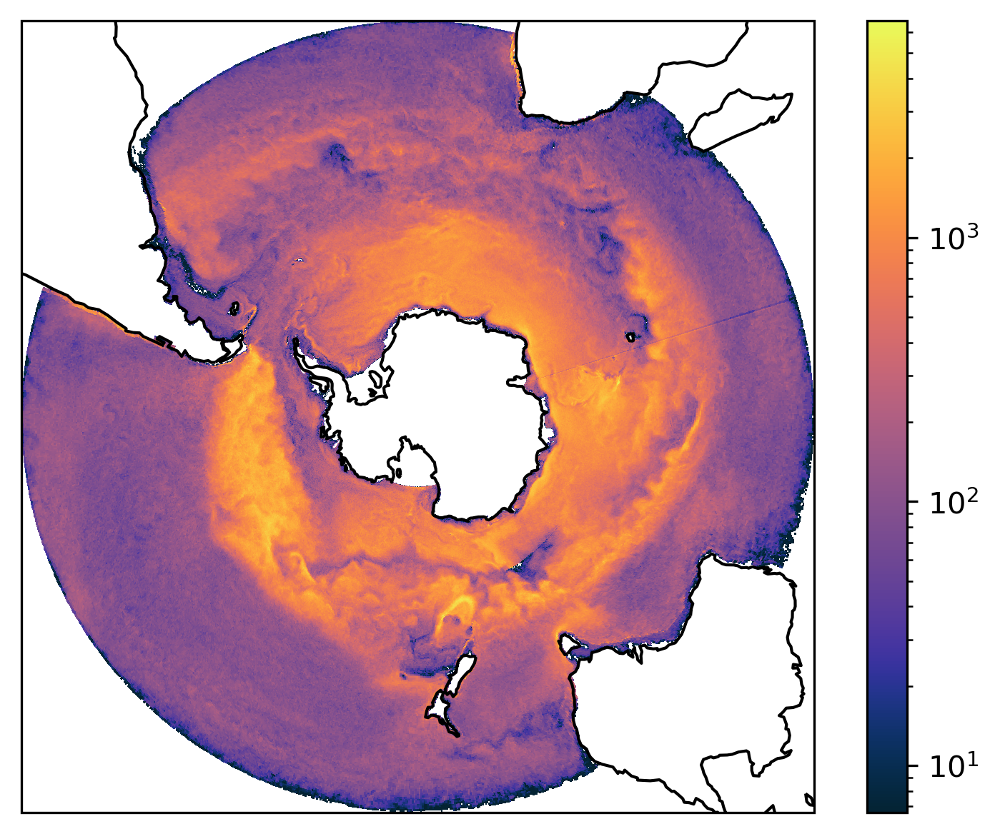

In [10]:
fig, ax = plt.subplots(1,1,dpi=300,subplot_kw={'projection':ccrs.SouthPolarStereo()})
lat = ds_domain_allign.gphit
lon = ds_domain_allign.glamt
xs = ds_domain_allign.e1t
ys =  ds_domain_allign.e2t
areas = xs*ys

vnorm = da_vol_xy/areas
vmax = vnorm.max().compute()

lognorm = matplotlib.colors.LogNorm(vmax = vmax, vmin = vmax /1e3 )
cax = ax.pcolormesh( lon, lat, da_vol_xy/areas, transform=ccrs.PlateCarree(), cmap=cmocean.cm.thermal, norm=lognorm )
ax.coastlines()
fig.colorbar(cax)



In [33]:
### Seasonal locations of ventilation

In [23]:
def plot_norm(ds_domain, vol_xy, y,log=True): 
    #print((vol_xy.head(5)))
    da_vol_xy = vol_xy.to_xarray()[f"{y}"]
    #print(da_vol_xy.head(4))
    # Define coordinates x_c and y_c which are the Pythonic indices rather than the TRACMASS indices. This ensures agreement with the coordinates for ds_domain
  
    da_vol_xy = da_vol_xy.assign_coords( {'x_c':da_vol_xy.binnedx_o - 1, 'y_c':da_vol_xy.binnedy_o - 1} ) 
    da_vol_xy = da_vol_xy.swap_dims({'binnedx_o':'x_c', 'binnedy_o':'y_c'})
    
    # Reorder axes to agree with ds_subdomain
    da_vol_xy = da_vol_xy.transpose("y_c","x_c",...)
    
    
    # Align the coordinates of the grid file with the subdomain in da_vol_xy
    ds_domain_allign, da_vol_xy = xr.align( ds_domain, da_vol_xy )

    fig, ax = plt.subplots(1,1,dpi=300,subplot_kw={'projection':ccrs.SouthPolarStereo()})
    lat = ds_domain_allign.gphit
    lon = ds_domain_allign.glamt
    xs = ds_domain_allign.e1t
    ys =  ds_domain_allign.e2t
    areas = xs*ys
    
    vnorm = da_vol_xy/areas
    vmax = vnorm.max().compute()
    if log == True:
        lognorm = matplotlib.colors.LogNorm(vmax = 10**(3.5), vmin = vmax /1e4 )
        cax = ax.pcolormesh( lon, lat, vnorm, transform=ccrs.PlateCarree(), cmap=cmocean.cm.thermal, norm=lognorm )
    else:
        cax = ax.pcolormesh( lon, lat, vnorm, transform=ccrs.PlateCarree(), cmap=cmocean.cm.thermal)
    ax.coastlines()
    fig.colorbar(cax)
    return fig ,ax

In [39]:
def plot(ds_domain, vol_xy, y,vmax=1e3,log=True, cmp =cmocean.cm.thermal ): 
    #print((vol_xy.head(5)))
    da_vol_xy = vol_xy.to_xarray()[y]
    #print(da_vol_xy.head(4))
    # Define coordinates x_c and y_c which are the Pythonic indices rather than the TRACMASS indices. This ensures agreement with the coordinates for ds_domain
  
    da_vol_xy = da_vol_xy.assign_coords( {'x_c':da_vol_xy.binnedx_o - 1, 'y_c':da_vol_xy.binnedy_o - 1} ) 
    da_vol_xy = da_vol_xy.swap_dims({'binnedx_o':'x_c', 'binnedy_o':'y_c'})
    
    # Reorder axes to agree with ds_subdomain
    da_vol_xy = da_vol_xy.transpose("y_c","x_c",...)
    
    
    # Align the coordinates of the grid file with the subdomain in da_vol_xy
    ds_domain_allign, da_vol_xy = xr.align( ds_domain, da_vol_xy )

    fig, ax = plt.subplots(1,1,dpi=200,subplot_kw={'projection':ccrs.SouthPolarStereo()})
    lat = ds_domain_allign.gphit
    lon = ds_domain_allign.glamt
    
    
    
    #vmax = vnorm.max().compute()

    
    vmin=vmax*1e-4    
    if log == True:
        lognorm = matplotlib.colors.LogNorm(vmax = 10**(3.5), vmin = vmax /1e4 )
        cax = ax.pcolormesh( lon, lat, da_vol_xy, transform=ccrs.PlateCarree(), cmap=cmp, norm=lognorm )
    else:
        cax = ax.pcolormesh( lon, lat,  da_vol_xy, transform=ccrs.PlateCarree(), cmap=cmp)
    ax.coastlines()
    fig.colorbar(cax)
    return fig ,ax

[]

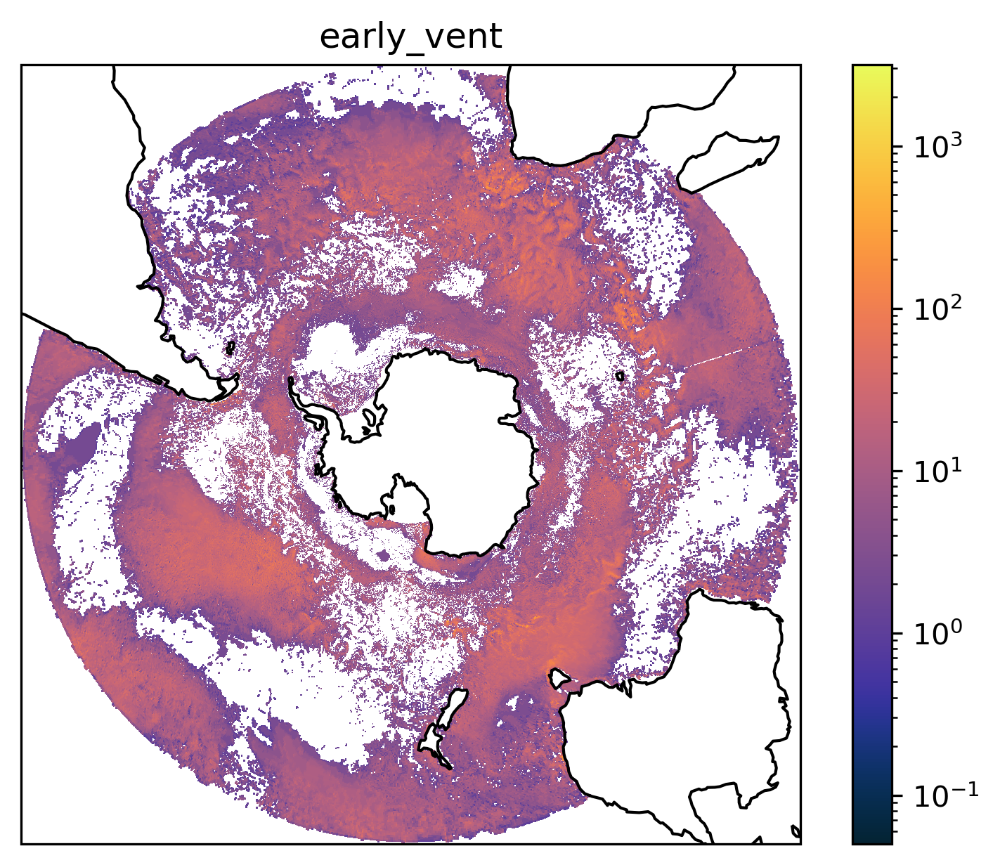

In [15]:
df_late = df_vent[df_vent['year_o']<1983]
df = df_late
df = df[['binnedx_o','binnedy_o','subvol_o']]
# Group together data which ventilated in the same horizontal grid cell (same combination of binnedx and binnedy)
df_group = df.groupby( ['binnedx_o','binnedy_o'])
# Calculate total volume in each grid cell
vol_xy = df_group.sum("subvol_o").compute()
plot_norm(ds_domain, vol_xy,'subvol_o')
plt.title('early_vent')
plt.plot()


[]

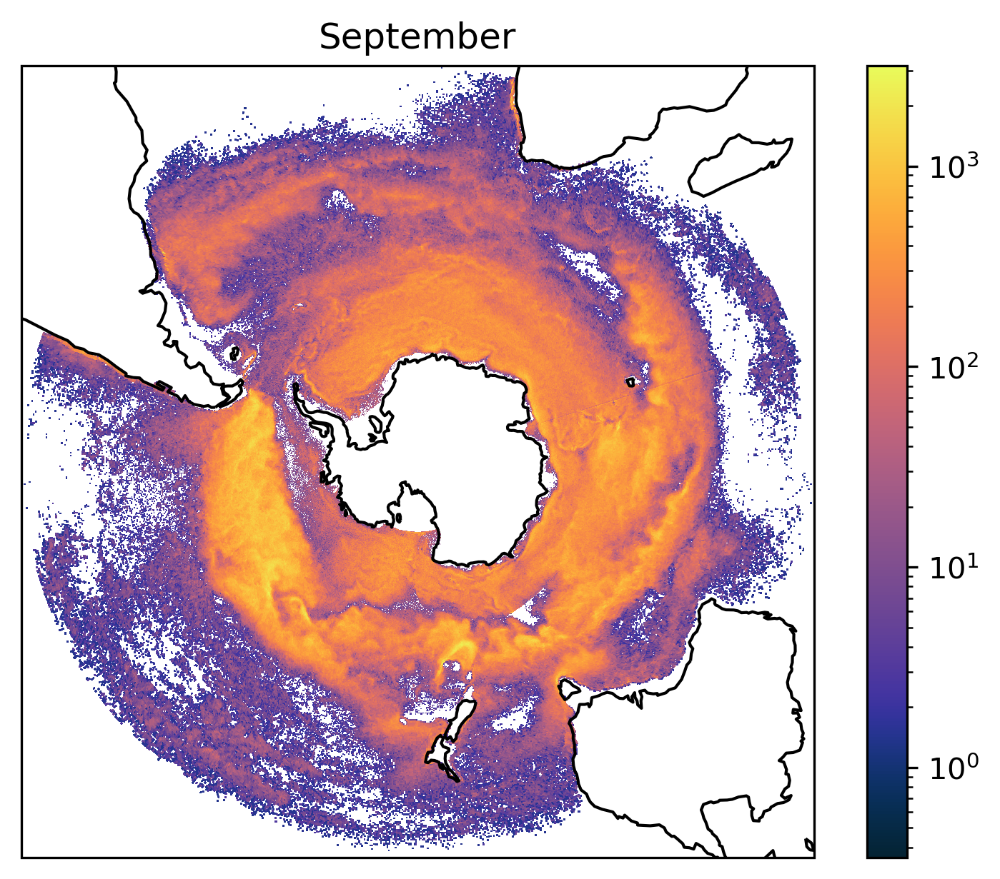

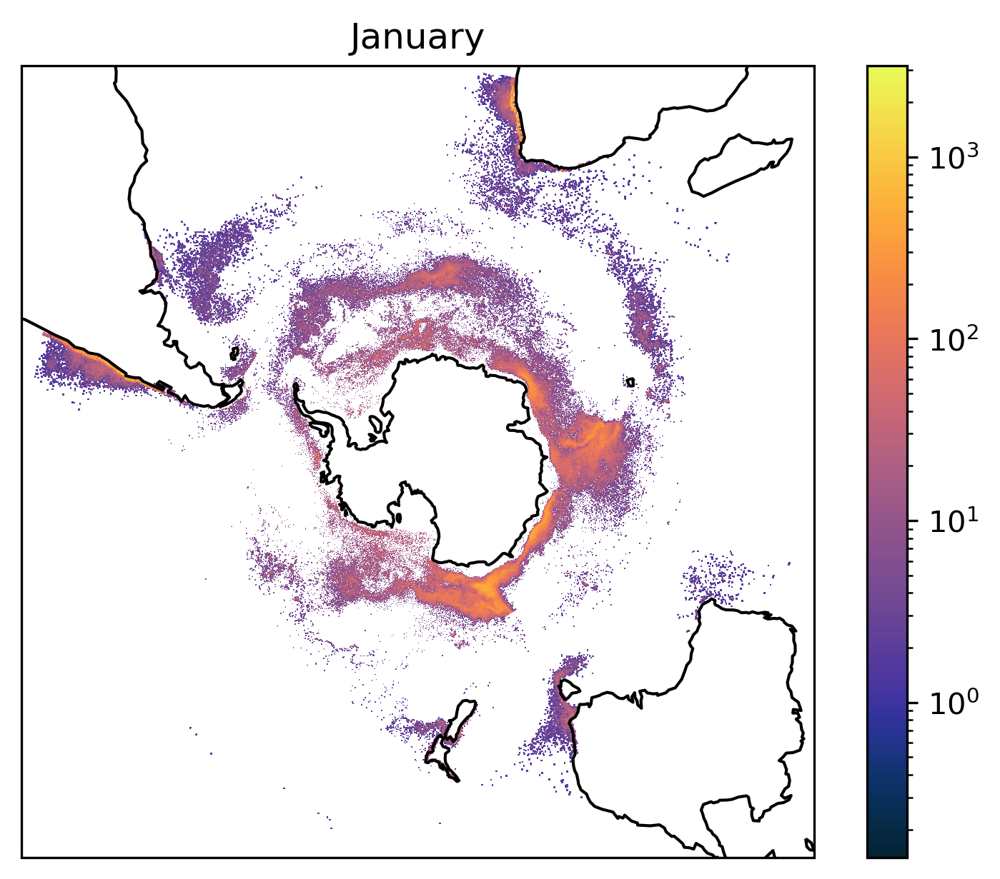

In [44]:
df_late = df_vent[df_vent['year_o']>1983]
df = df_late[(df_late['month_o']>=8)& (df_late['month_o']<=10)]
df = df[['binnedx_o','binnedy_o','subvol_o']]
# Group together data which ventilated in the same horizontal grid cell (same combination of binnedx and binnedy)
df_group = df.groupby( ['binnedx_o','binnedy_o'])
# Calculate total volume in each grid cell
vol_xy = df_group.sum("subvol_o").compute()
plot_norm(ds_domain, vol_xy,'subvol_o')
plt.title('September')
plt.plot()


df = df_late[(df_late['month_o']==12)|(df_late['month_o']<=3) ]

df = df[['binnedx_o','binnedy_o','subvol_o']]
# Group together data which ventilated in the same horizontal grid cell (same combination of binnedx and binnedy)
df_group = df.groupby( ['binnedx_o','binnedy_o'])
# Calculate total volume in each grid cell
vol_xy = df_group.sum("subvol_o").compute()
plot_norm(ds_domain, vol_xy,'subvol_o')
plt.title('January')
plt.plot()

In [35]:
###Age of ventilated water
# group by x,y
# plot mean age

df = df_vent[['binnedx_o','binnedy_o','time_o']]
df_group = df.groupby( ['binnedx_o','binnedy_o'])
count = df_group.mean("time_o").compute()



(<Figure size 1280x960 with 2 Axes>, <GeoAxes: >)

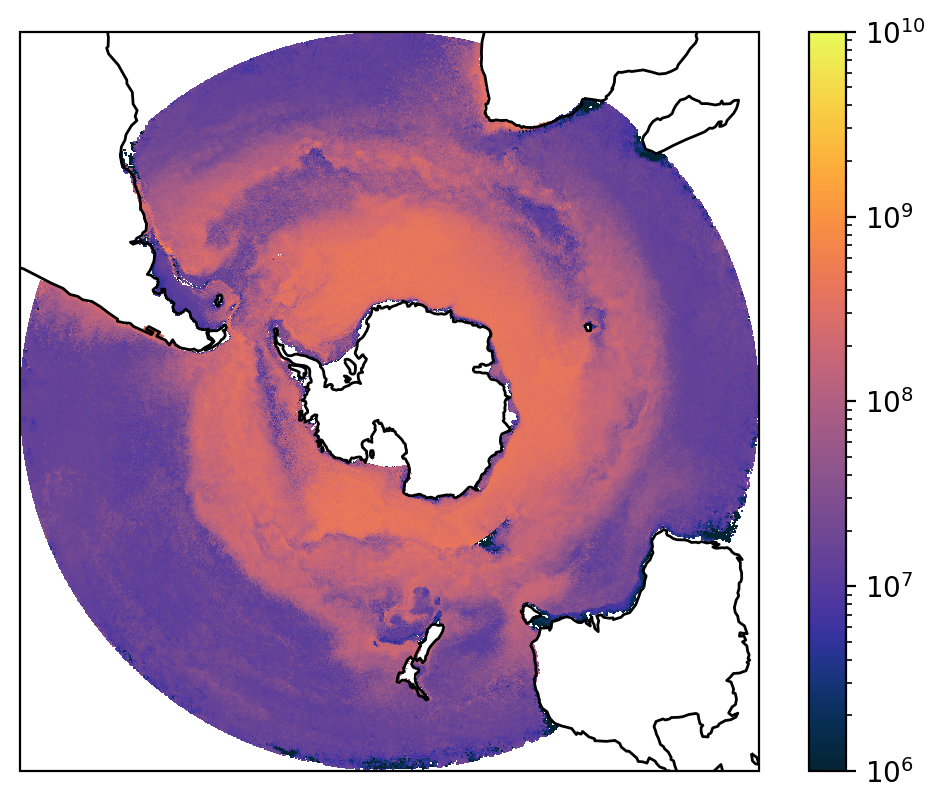

In [42]:
plot(ds_domain, count, "time_o",vmax = 1e10)

In [ ]:
##Now by month

[]

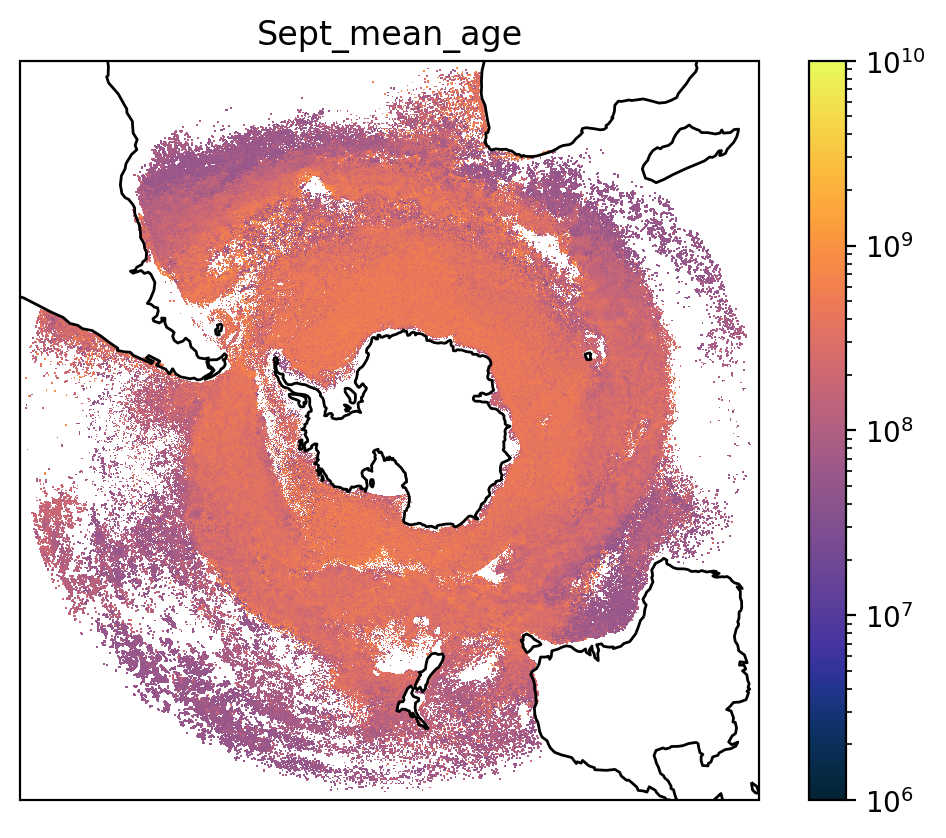

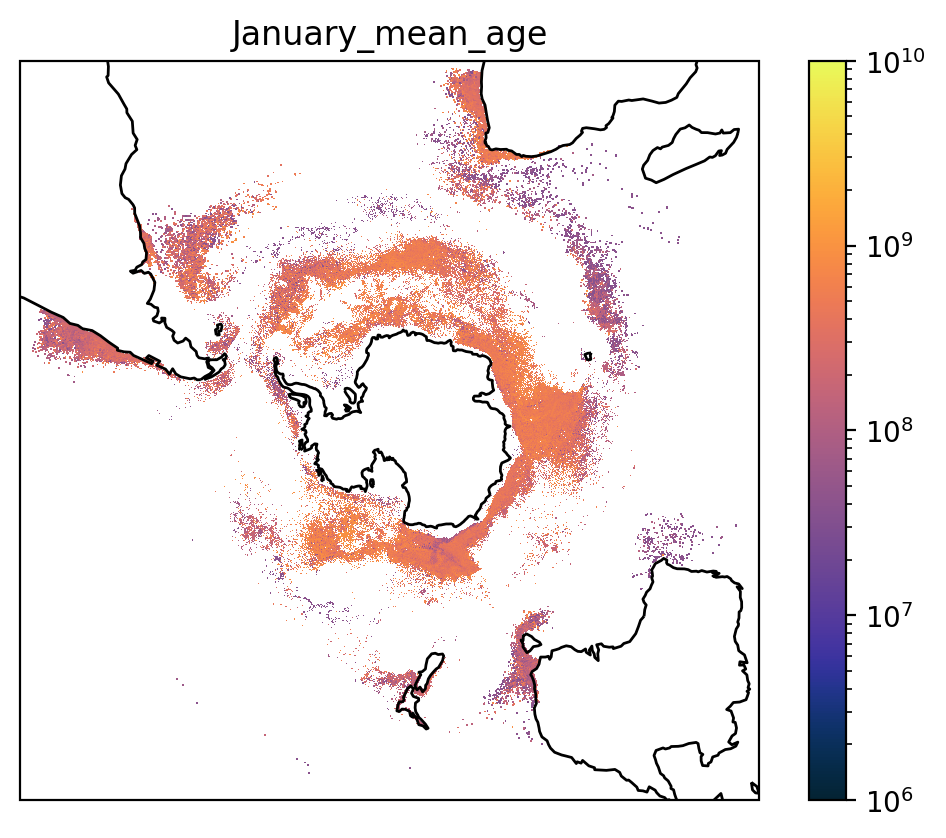

In [41]:
df_late = df_vent[df_vent['year_o']>1983]
df = df_late[df_vent['month_o']==9]
df = df[['binnedx_o','binnedy_o','time_o']]
# Group together data which ventilated in the same horizontal grid cell (same combination of binnedx and binnedy)
df_group = df.groupby( ['binnedx_o','binnedy_o'])
# Calculate total volume in each grid cell
vol_xy = df_group.mean("time_o").compute()
plot(ds_domain, vol_xy,'time_o',vmax = 1e10)
plt.title('Sept_mean_age')
plt.plot()


df = df_late[(df_late['month_o']==12)|(df_late['month_o']<=3) ]

df = df[['binnedx_o','binnedy_o','time_o']]
# Group together data which ventilated in the same horizontal grid cell (same combination of binnedx and binnedy)
df_group = df.groupby( ['binnedx_o','binnedy_o'])
# Calculate total volume in each grid cell
vol_xy = df_group.mean("time_o").compute()
plot(ds_domain, vol_xy,'time_o',vmax = 1e10)
plt.title('January_mean_age')
plt.plot()

[]

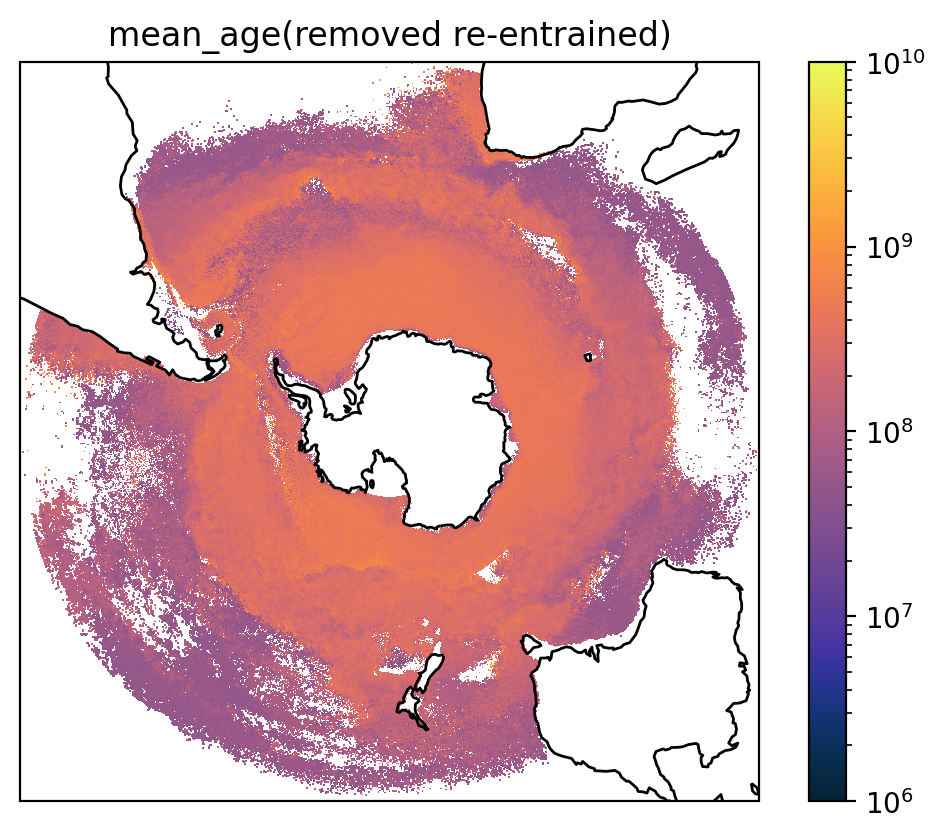

In [39]:
df_late = df_vent[df_vent['year_o']>1983]
df = df_late
df = df[['binnedx_o','binnedy_o','time_o']]
# Group together data which ventilated in the same horizontal grid cell (same combination of binnedx and binnedy)
df_group = df.groupby( ['binnedx_o','binnedy_o'])
# Calculate total volume in each grid cell
vol_xy = df_group.mean("time_o").compute()
plot(ds_domain, vol_xy,'time_o',vmax = 1e10)
plt.title('mean_age(removed re-entrained)')
plt.plot()


In [30]:
##### initial depth (averaged)

df_late = df_vent[df_vent['year_o']>1983]
df = df_late
df = df[['binnedx_o','binnedy_o','z_i']]
# Group together data which ventilated in the same horizontal grid cell (same combination of binnedx and binnedy)
df_group = df.groupby( ['binnedx_o','binnedy_o'])
# Calculate total volume in each grid cell
vol_xy = df_group.mean("z_i").compute()


[]

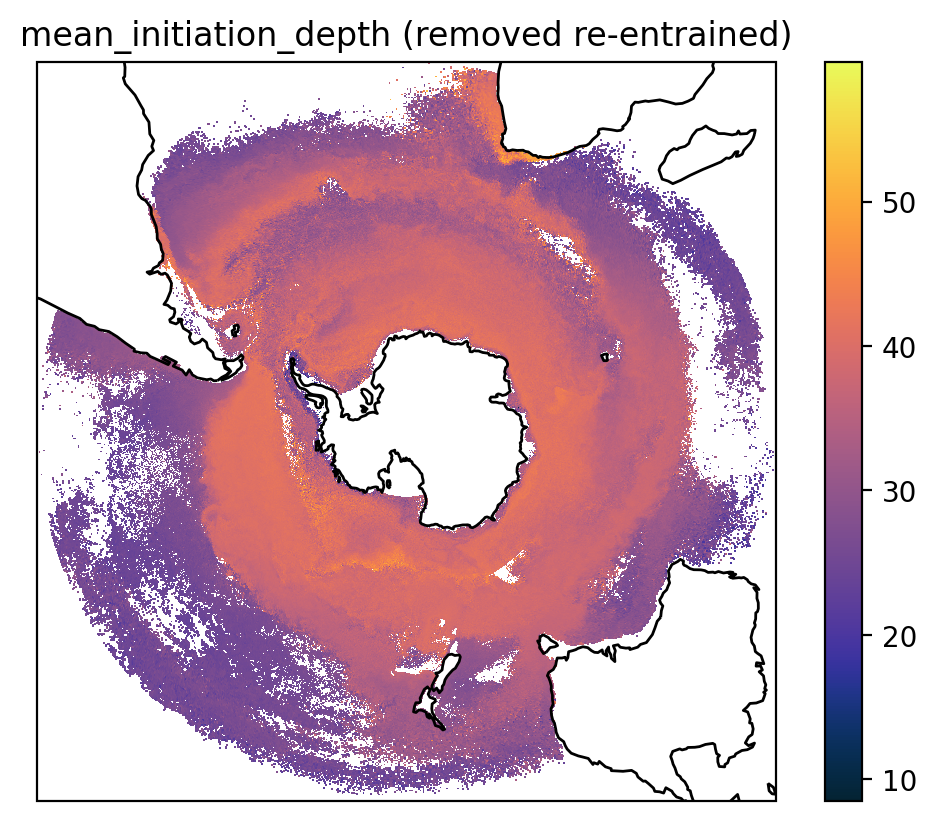

In [31]:
plot(ds_domain, vol_xy,'z_i',vmax = 1e2,log = False)
plt.title('mean_initiation_depth (removed re-entrained)')
plt.plot()

In [ ]:
#final depth (topography of mixed layer)


In [41]:
df_late = df_vent[df_vent['year_o']>1983]
df = df_late
df = df[['binnedx_o','binnedy_o','z_o']]
# Group together data which ventilated in the same horizontal grid cell (same combination of binnedx and binnedy)
df_group = df.groupby( ['binnedx_o','binnedy_o'])
# Calculate total volume in each grid cell
vol_xy = df_group.mean("z_o").compute()

[]

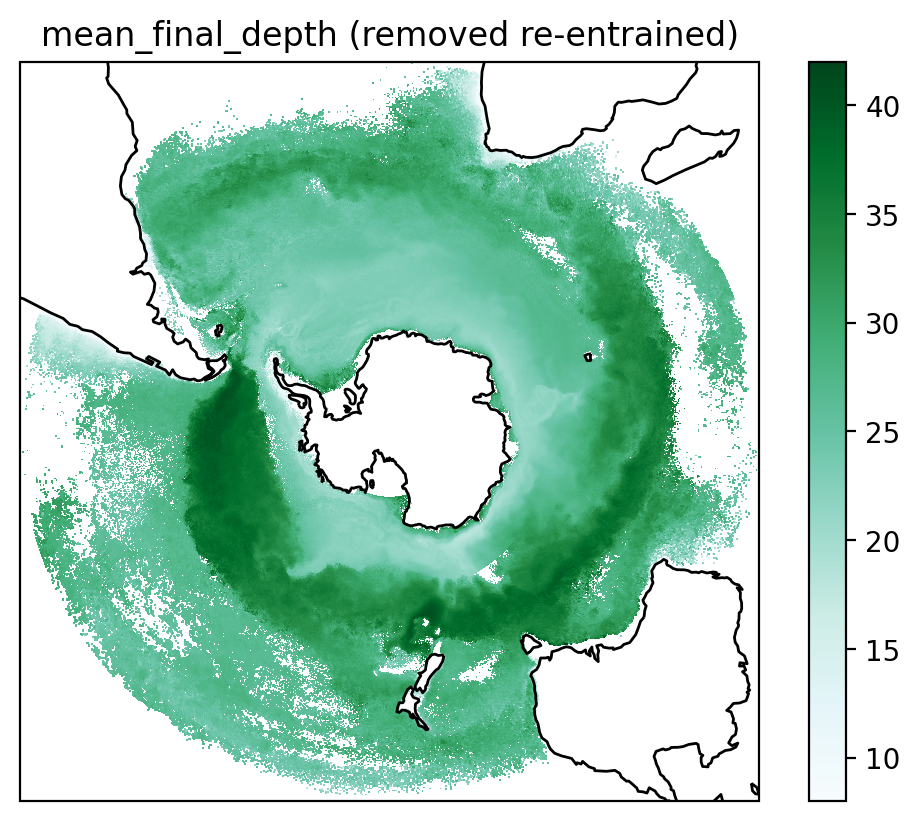

In [42]:
plot(ds_domain, vol_xy,'z_o',vmax = 1e3,log = False, cmp = 'BuGn')
plt.title('mean_final_depth (removed re-entrained)')
plt.plot()

In [ ]:
# density at ventilation

In [45]:
df_late = df_vent[df_vent['year_o']>1983]
df = df_late
df = df[['binnedx_o','binnedy_o','density_o']]
# Group together data which ventilated in the same horizontal grid cell (same combination of binnedx and binnedy)
df_group = df.groupby( ['binnedx_o','binnedy_o'])
# Calculate total volume in each grid cell
vol_xy = df_group.mean("density_o").compute()


Text(0.5, 1.0, 'density final')

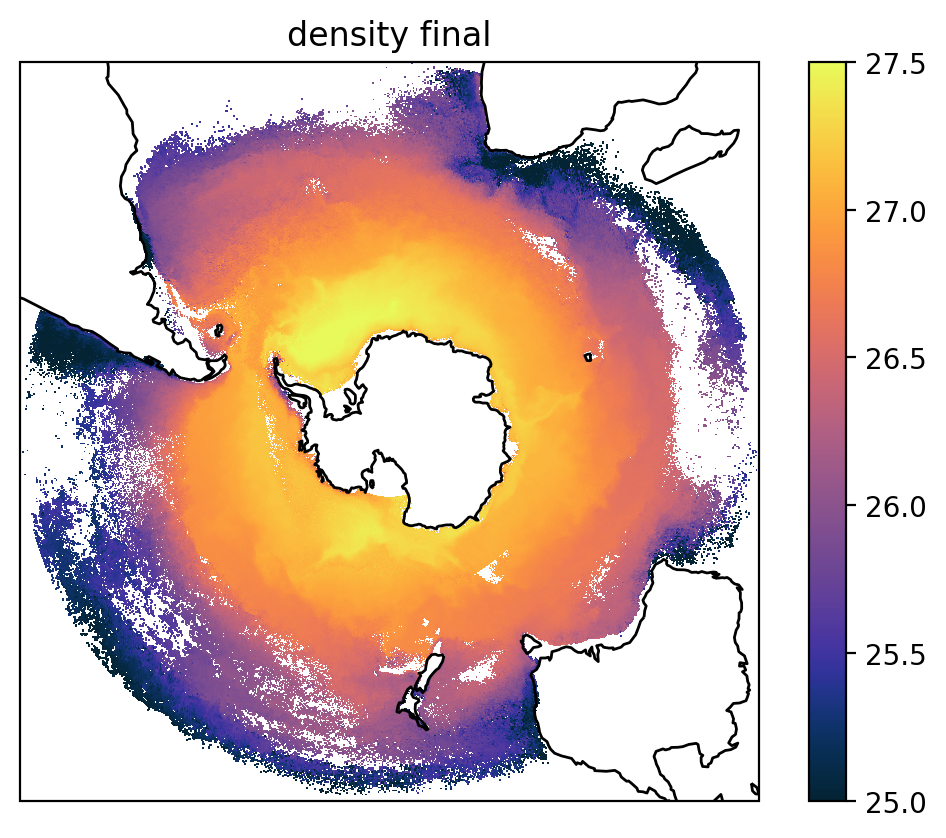

In [46]:
#print((vol_xy.head(5)))

da_vol_xy = vol_xy.to_xarray()['density_o']
#print(da_vol_xy.head(4))
# Define coordinates x_c and y_c which are the Pythonic indices rather than the TRACMASS indices. This ensures agreement with the coordinates for ds_domain

da_vol_xy = da_vol_xy.assign_coords( {'x_c':da_vol_xy.binnedx_o - 1, 'y_c':da_vol_xy.binnedy_o - 1} ) 
da_vol_xy = da_vol_xy.swap_dims({'binnedx_o':'x_c', 'binnedy_o':'y_c'})

# Reorder axes to agree with ds_subdomain
da_vol_xy = da_vol_xy.transpose("y_c","x_c",...)


# Align the coordinates of the grid file with the subdomain in da_vol_xy
ds_domain_allign, da_vol_xy = xr.align( ds_domain, da_vol_xy )

fig, ax = plt.subplots(1,1,dpi=200,subplot_kw={'projection':ccrs.SouthPolarStereo()})
lat = ds_domain_allign.gphit
lon = ds_domain_allign.glamt



#vmax = vnorm.max().compute()



lognorm = matplotlib.colors.LogNorm(vmax = 27.5, vmin =25 )
cax = ax.pcolormesh( lon, lat, da_vol_xy, transform=ccrs.PlateCarree(), cmap=cmocean.cm.thermal,vmin=25., vmax=27.5)
ax.coastlines()
fig.colorbar(cax)
plt.title('density final')